# 上皮抽出〜SingleR実行

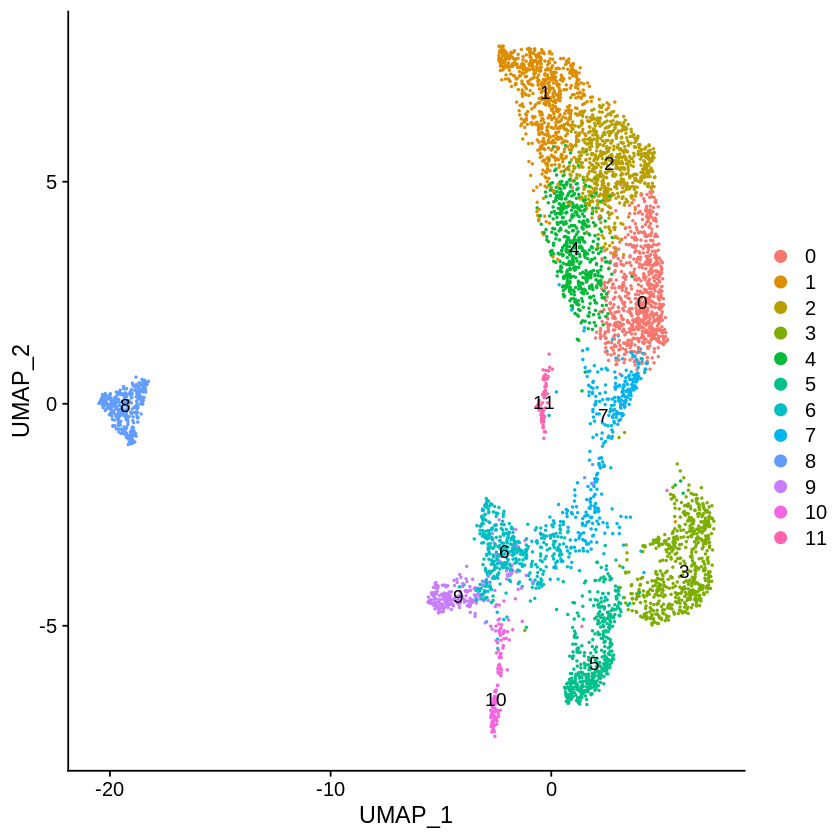

In [213]:
DimPlot(stomach_epithelial, label = TRUE)
# 0,1,2,4 foveolar
# 3 APOA1-4とか作ってるやつ
# 5 HSP出ている→損傷した腺細胞
# 6 MUC6多め→胃底腺側の腺細胞
# 7 よくわからない
# 8 これもよくわからない
# 9 chief cell
# 10 

# ----------------------------------------------------------------------------------------------------------------------------------

# Memo
# 各クラスター推定
### #0: 
### #1: CD20(+) -> B cell
### #2: Plasma cell 
### #3: stomach epithelial cell
### #4: ゴミ？
### #5: T cell
### #6: T cell前駆？？　
### #7: NK cell or CD8 T cell
### #8: いつも出てくるよくわからない免疫細胞
### #9: stomach epithelial cell
### #10: plasma cell 
### #11: plasma cell
### #12: fibroblast
### #13: plasma cell
### #14: myeloid cell?
### #15: myeloid or T cell
### #16: stomach epithelial cell
### #17: stomach epithelial cell
### #18: plasma cell
### #19: plasma cell
### #20: 血液系っぽいが・・・
### #21: plasma cell
### #22: smooth muscle cell
### #23: ごみ？　
### #24: plasma cell
### #25: adipocyte or smooth muscle cell
### #26: hemoglobin -> RBC??
### #27: ckit陽性???, mast cell???
### #28: mesenchymal cell
### #29: plasma cell
### #30: plasma cell
### #31: plasma cell
### #32: plasma cell or dendric cell?

In [1]:
library(Seurat)
library(Matrix)
library(ggplot2)
library(cowplot)
library(dplyr)
library(enrichR)


********************************************************
Note: As of version 1.0.0, cowplot does not change the
  default ggplot2 theme anymore. To recover the previous
  behavior, execute:
  theme_set(theme_cowplot())
********************************************************


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



In [15]:
AddGeneSetScore <- function(data.integrated, genes){
    sum.exp <- rowSums(FetchData(object = data.integrated,
                                   vars = genes),
                          na.rm = TRUE)

    if (all(names(x = sum.exp) == rownames(x = data.integrated@meta.data))) {
      cat("Cell names order match in 'mean.exp' and 'object@meta.data':\n", 
          "adding gene set mean expression values in 'object@meta.data$gene.set.score'")
      return (sum.exp)
    }
}

In [162]:
load('NewData_Normal_Total_epithelial_only.RData')

In [3]:
# 上皮細胞のみ
stomach_epithelial

An object of class Seurat 
42921 features across 8612 samples within 3 assays 
Active assay: integrated (3000 features)
 2 other assays present: RNA, SCT
 2 dimensional reductions calculated: pca, umap

In [163]:
reticulate::import(module = "umap")

Module(umap)

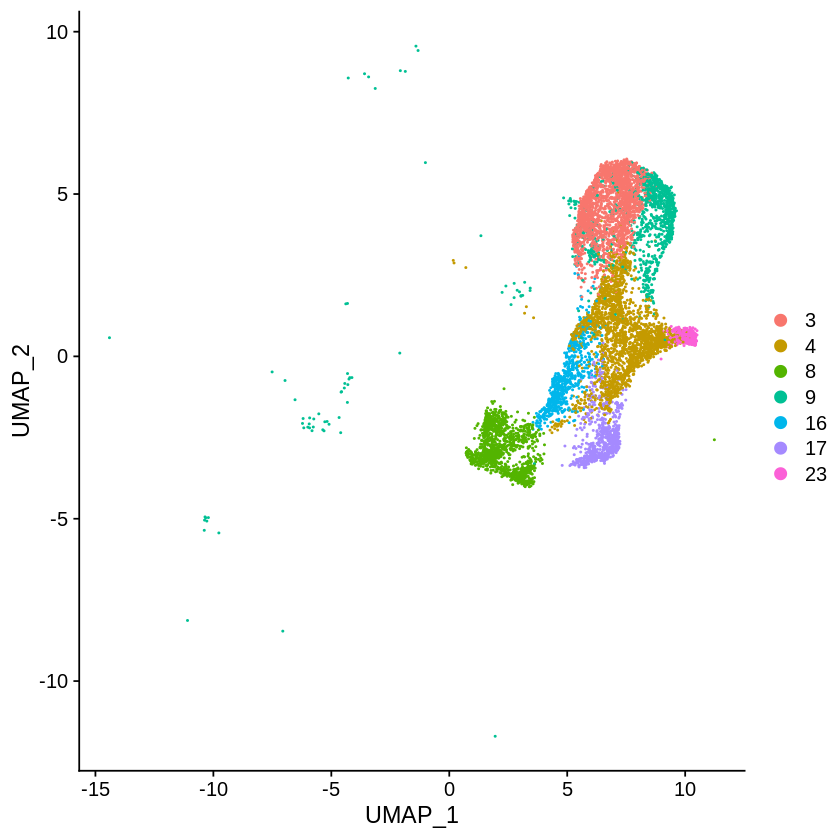

In [7]:
DimPlot(stomach_epithelial, as_label=FALSE)

In [164]:
stomach_epithelial <- RunPCA(stomach_epithelial, verbose = TRUE)

In [165]:
stomach_epithelial <- RunUMAP(stomach_epithelial, dims = 1:30, verbose = FALSE, umap.method = 'umap-learn', metric = 'correlation')

In [166]:
stomach_epithelial <- FindNeighbors(stomach_epithelial, dims = 1:30, verbose = FALSE)
stomach_epithelial <- FindClusters(stomach_epithelial, verbose = FALSE)

In [167]:
stomach_epithelial@active.assay <- 'SCT'

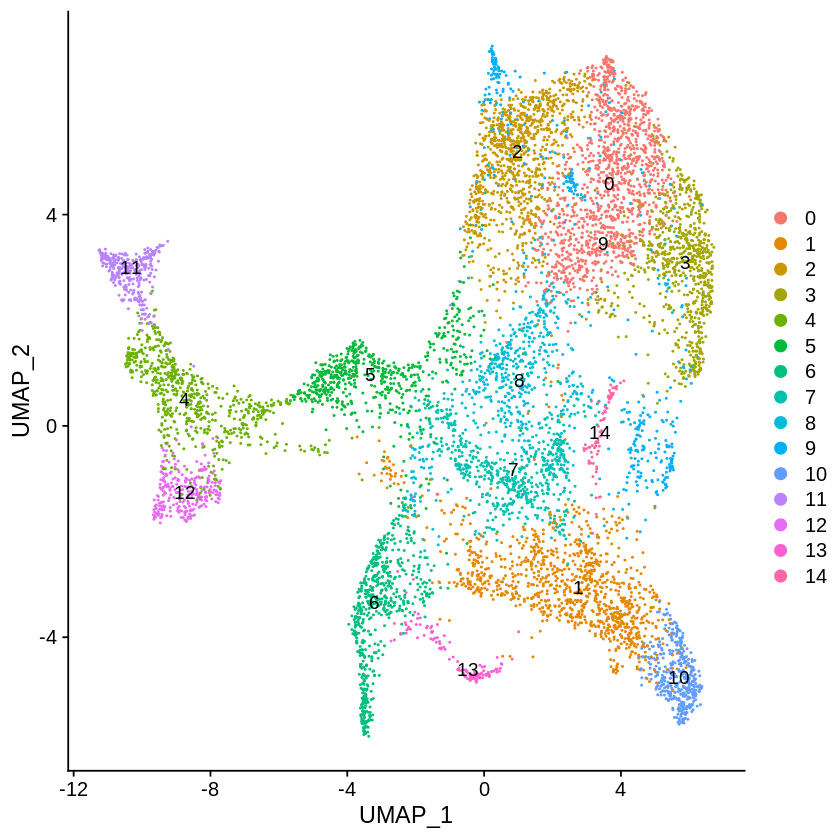

In [169]:
DimPlot(stomach_epithelial, label = TRUE)

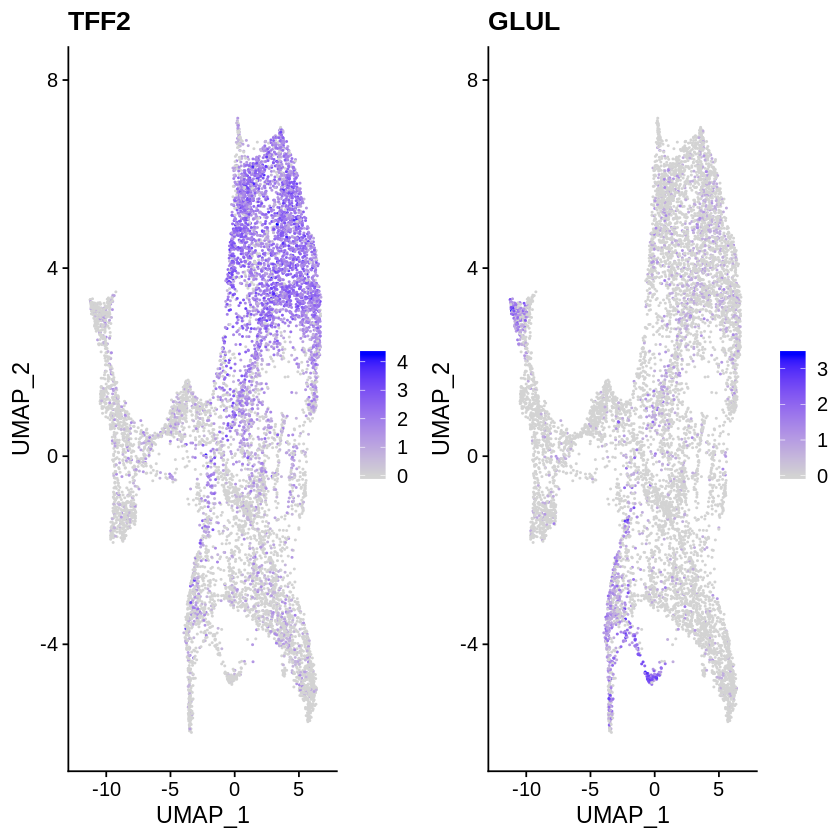

In [58]:
FeaturePlot(stomach_epithelial, features=c('TFF2','GLUL'))

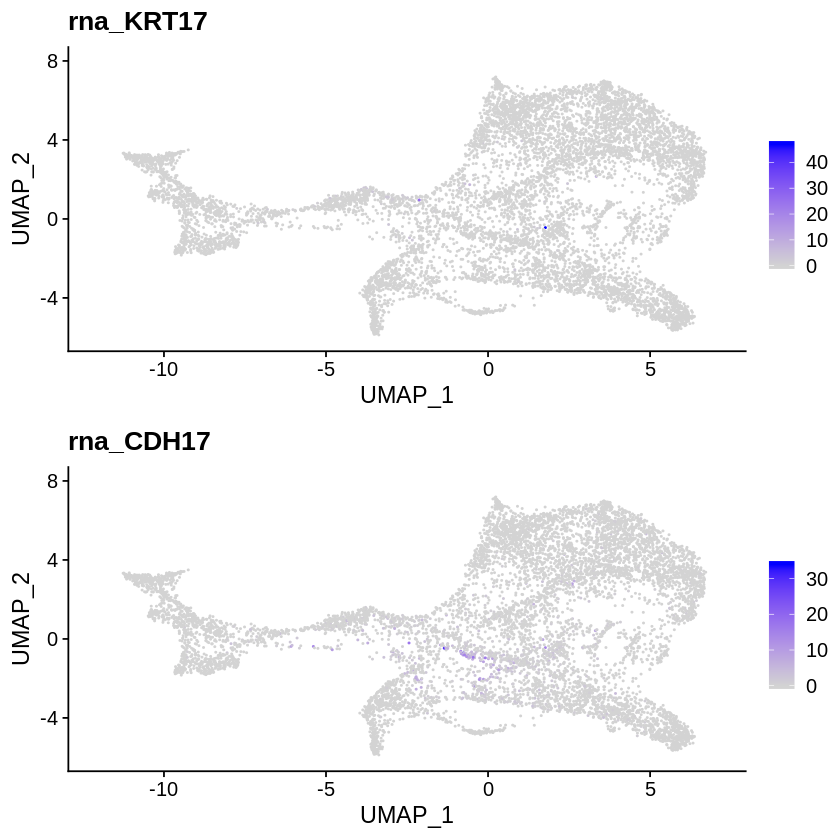

In [59]:
FeaturePlot(object =stomach_epithelial, features = c("rna_KRT17","rna_CDH17"),ncol=1)

Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'

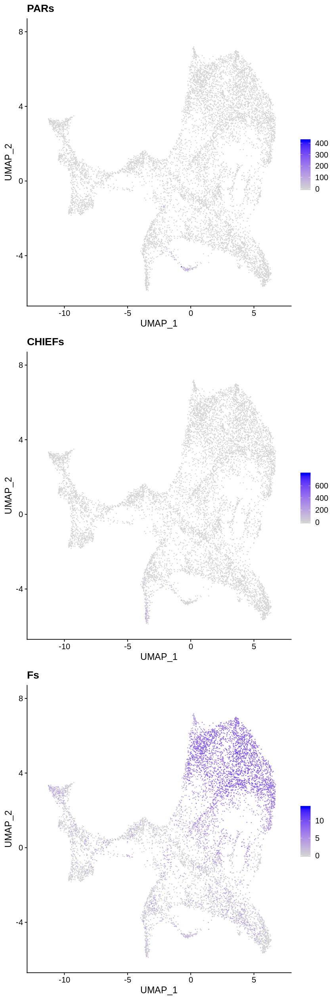

In [60]:
stomach_epithelial$CHIEFs <- AddGeneSetScore(stomach_epithelial,
                                   c("LIPF","PGC","rna_PGA3","rna_PGA4","rna_PGA5"))
stomach_epithelial$PARs <- AddGeneSetScore(stomach_epithelial,
                                   c("rna_ATP4B","rna_GIF"))
stomach_epithelial$Fs <- AddGeneSetScore(stomach_epithelial,
                                   c("GKN1", "PSCA","MUC5AC"))

options(repr.plot.width=7, repr.plot.height=21)
FeaturePlot(object = stomach_epithelial, features = c("PARs","CHIEFs","Fs"), ncol=1, pt.size = 0.1)

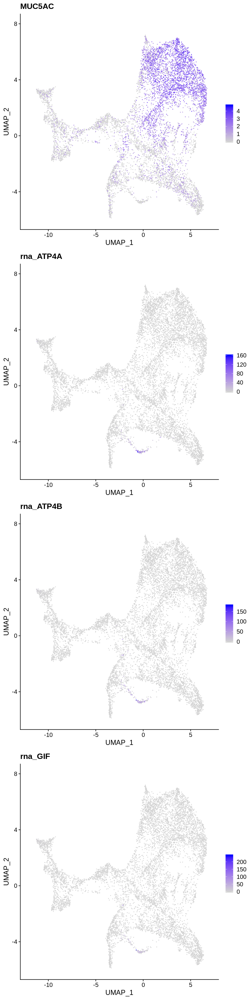

In [61]:
#epithelium
options(repr.plot.width=7, repr.plot.height=28)
FeaturePlot(object = stomach_epithelial, features = c("MUC5AC",'rna_ATP4A',"rna_ATP4B","rna_GIF"),ncol=1)

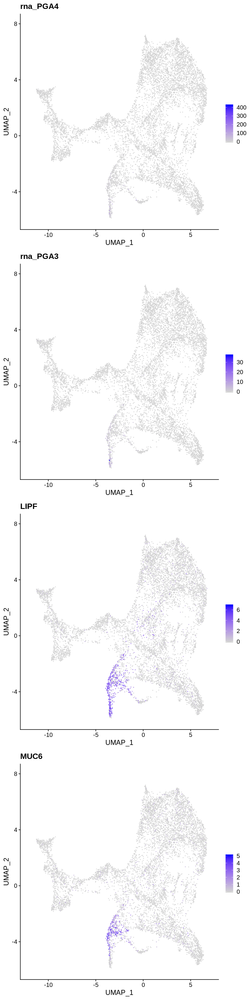

In [62]:
options(repr.plot.width=7, repr.plot.height=28)
FeaturePlot(object = stomach_epithelial, features = c('rna_PGA4', "rna_PGA3",'LIPF',"MUC6"), ncol = 1)

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: rna_TAC1, rna_NEUROG3”

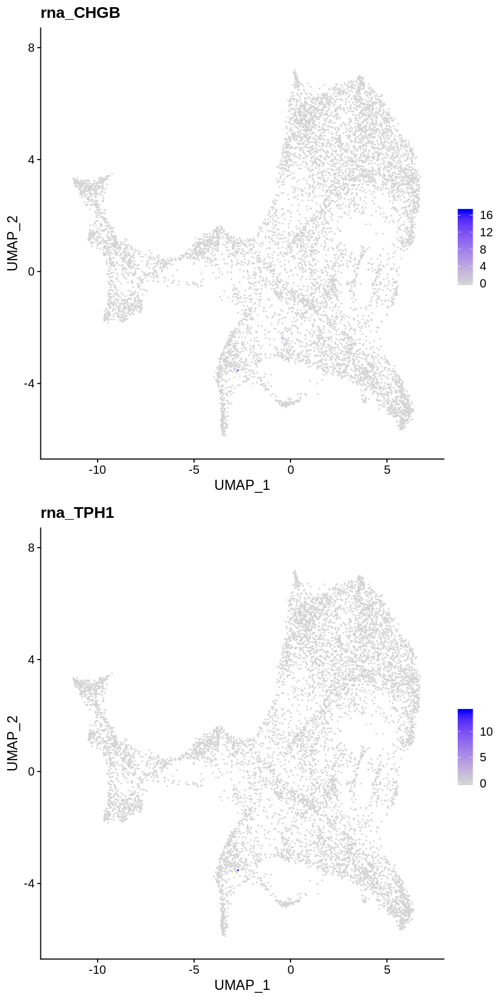

In [63]:
options(repr.plot.width=7, repr.plot.height=14)
FeaturePlot(object = stomach_epithelial, features = c('rna_CHGB','rna_TAC1','rna_TPH1','rna_NEUROG3'), ncol = 1)

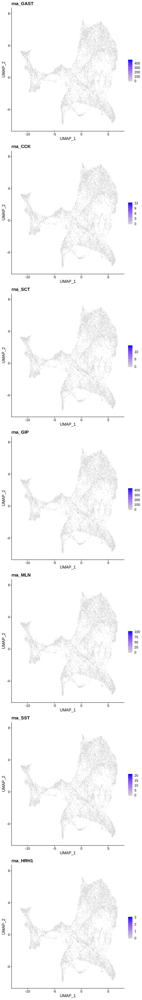

In [64]:
#endocrine
options(repr.plot.width=7, repr.plot.height=7*7)
FeaturePlot(object = stomach_epithelial, features = c("rna_GAST","rna_CCK","rna_SCT","rna_GIP","rna_MLN","rna_SST","rna_HRH1"), ncol = 1)

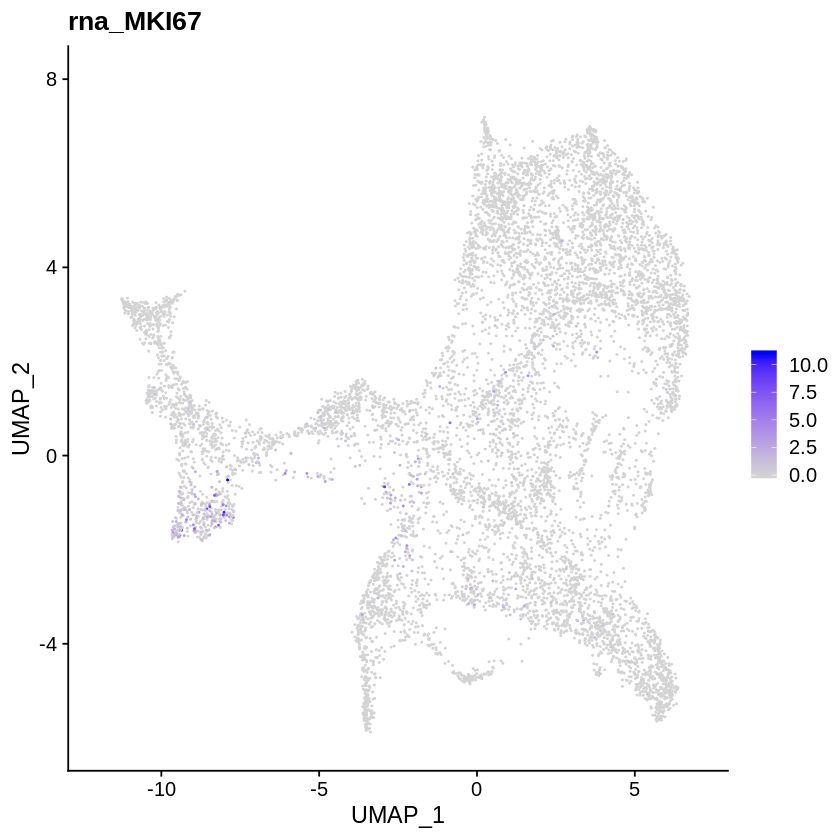

In [65]:
options(repr.plot.width=7, repr.plot.height=7)
FeaturePlot(object = stomach_epithelial, features = c("rna_MKI67"))

In [66]:
stomach.markers <- FindAllMarkers(object = stomach_epithelial, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster 0
Calculating cluster 1
Calculating cluster 2
Calculating cluster 3
Calculating cluster 4
Calculating cluster 5
Calculating cluster 6
Calculating cluster 7
Calculating cluster 8
Calculating cluster 9
Calculating cluster 10
Calculating cluster 11
Calculating cluster 12
Calculating cluster 13
Calculating cluster 14


In [67]:
stomach.markers %>% group_by(cluster) %>% top_n(n = 5, wt = avg_logFC) 

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,1.3924297,0.982,0.510,0.000000e+00,0,MUC1
0.000000e+00,1.3887063,0.986,0.440,0.000000e+00,0,MUC5AC
0.000000e+00,1.3669176,0.965,0.501,0.000000e+00,0,GKN1
0.000000e+00,1.3577644,0.963,0.463,0.000000e+00,0,PSCA
0.000000e+00,1.3246904,0.929,0.361,0.000000e+00,0,GKN2
8.311895e-282,0.7968404,1.000,0.995,1.516672e-277,1,MT-CO3
2.483193e-274,0.8018468,1.000,0.995,4.531082e-270,1,MT-CO2
2.666612e-270,0.7731744,1.000,0.973,4.865768e-266,1,MT-CYB
4.007244e-232,0.8244673,0.999,0.923,7.312019e-228,1,MT-ND1


# cluster 0は上皮

In [94]:
stomach.markers %>% group_by(cluster) %>% filter(cluster==0) %>% select(c(p_val_adj,gene))

Adding missing grouping variables: `cluster`


cluster,p_val_adj,gene
<fct>,<dbl>,<chr>
0,0.000000e+00,MUC1
0,0.000000e+00,MUC5AC
0,0.000000e+00,GKN1
0,0.000000e+00,PSCA
0,0.000000e+00,GKN2
0,0.000000e+00,TFF1
0,0.000000e+00,TFF2
0,0.000000e+00,CA2
0,0.000000e+00,S100P


# cluster 1は上皮ではなさそう

stomach.markers %>% group_by(cluster) %>% filter(cluster==1) %>% select(c(p_val_adj,gene))

# cluster 2は上皮

stomach.markers %>% group_by(cluster) %>% filter(cluster==2) %>% select(c(p_val_adj,gene))

# cluster 3は上皮

stomach.markers %>% group_by(cluster) %>% filter(cluster==3) %>% select(c(p_val_adj,gene))

# cluster 4はsmooth muscle

stomach.markers %>% group_by(cluster) %>% filter(cluster==4) %>% select(c(p_val_adj,gene))

# cluster 5はBronchial epithelial???

stomach.markers %>% group_by(cluster) %>% filter(cluster==5) %>% select(c(p_val_adj,gene))

# cluster ６は上皮（たぶん主細胞）

stomach.markers %>% group_by(cluster) %>% filter(cluster==6) %>% select(c(p_val_adj,gene))

# cluster 7は上皮（たぶん小腸の化生)

stomach.markers %>% group_by(cluster) %>% filter(cluster==7) %>% select(c(p_val_adj,gene))

# cluster 8は上皮

stomach.markers %>% group_by(cluster) %>% filter(cluster==8) %>% select(c(p_val_adj,gene))

# cluster 9はplasma?

stomach.markers %>% group_by(cluster) %>% filter(cluster==9) %>% select(c(p_val_adj,gene))

# cluster 10はゴミっぽい

stomach.markers %>% group_by(cluster) %>% filter(cluster==10) %>% select(c(p_val_adj,gene))

# cluster 11は上皮

stomach.markers %>% group_by(cluster) %>% filter(cluster==11) %>% select(c(p_val_adj,gene))

# cluster 12は免疫細胞(いつも出てくるよくわからないやつ)

stomach.markers %>% group_by(cluster) %>% filter(cluster==12) %>% select(c(p_val_adj,gene))

# cluster 13は上皮

stomach.markers %>% group_by(cluster) %>% filter(cluster==13) %>% select(c(p_val_adj,gene))

# cluster 14は上皮

stomach.markers %>% group_by(cluster) %>% filter(cluster==14) %>% select(c(p_val_adj,gene))

In [44]:
library(SingleR)

In [68]:
slotNames(stomach_epithelial)

[1] "assays"       "meta.data"    "active.assay" "active.ident" "graphs"      
 [6] "neighbors"    "reductions"   "project.name" "misc"         "version"     
[11] "commands"     "tools"

以上より、上皮細胞はclusterの0,2,3,5,6,7,8,11,13,14

In [170]:
stomach_epithelial2 <- subset(stomach_epithelial, idents = c(0,2,3,5,6,7,8,11,13,14))

In [171]:
stomach_epithelial2

An object of class Seurat 
42921 features across 5793 samples within 3 assays 
Active assay: SCT (18247 features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [172]:
save(stomach_epithelial2, file='NewData_Normal_Total_epithelial_v2.RData')

# 2nd session

In [186]:
load('NewData_Normal_Total_epithelial_v2.RData')

In [187]:
stomach_epithelial2@active.assay <- 'integrated'

In [188]:
stomach_epithelial2 <- RunPCA(stomach_epithelial2, verbose = TRUE)

In [189]:
stomach_epithelial2 <- RunUMAP(stomach_epithelial2, dims = 1:30, verbose = FALSE, umap.method = 'umap-learn', metric = 'correlation')

In [190]:
stomach_epithelial2 <- FindNeighbors(stomach_epithelial2, dims = 1:30, verbose = FALSE)
stomach_epithelial2 <- FindClusters(stomach_epithelial2, verbose = FALSE)

In [191]:
stomach_epithelial2@active.assay <- 'SCT'

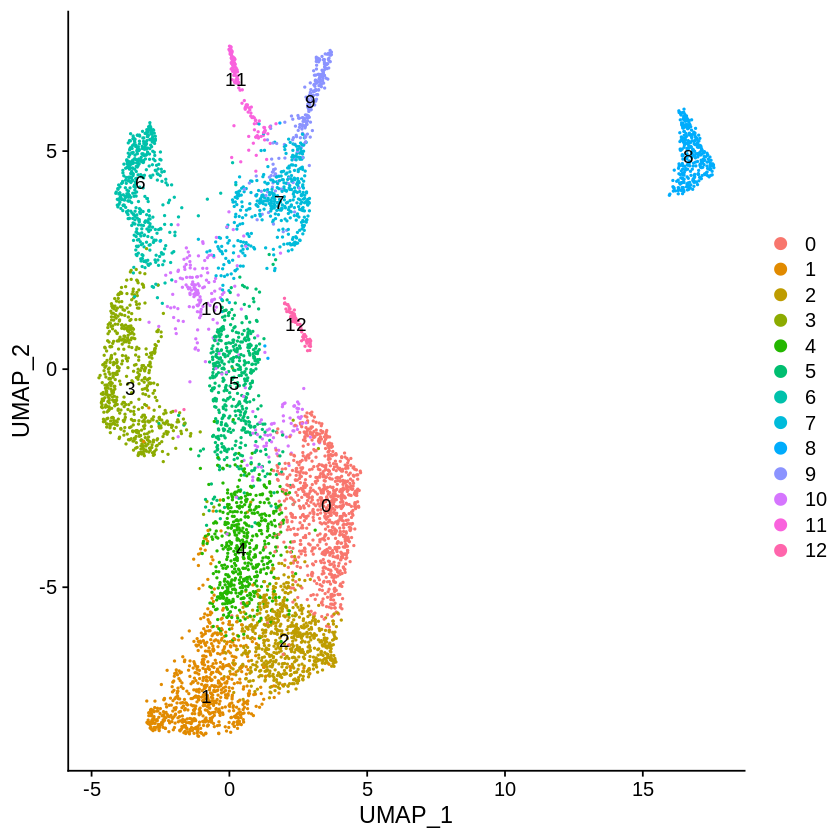

In [192]:
DimPlot(stomach_epithelial2, label = TRUE)

In [193]:
stomach_epithelial <- stomach_epithelial2

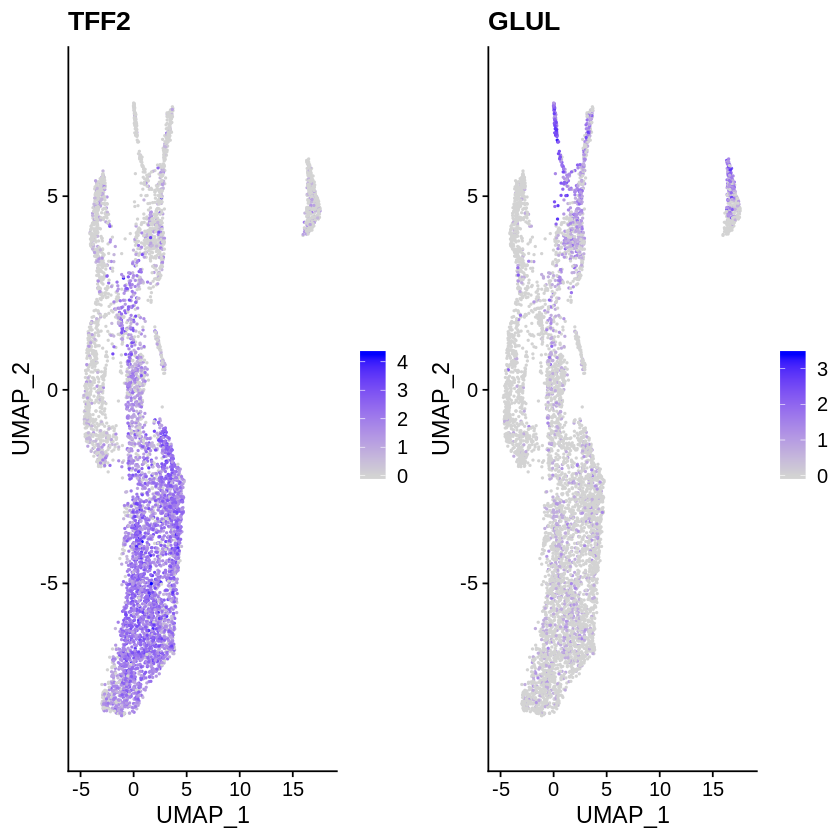

In [194]:
FeaturePlot(stomach_epithelial, features=c('TFF2','GLUL'))

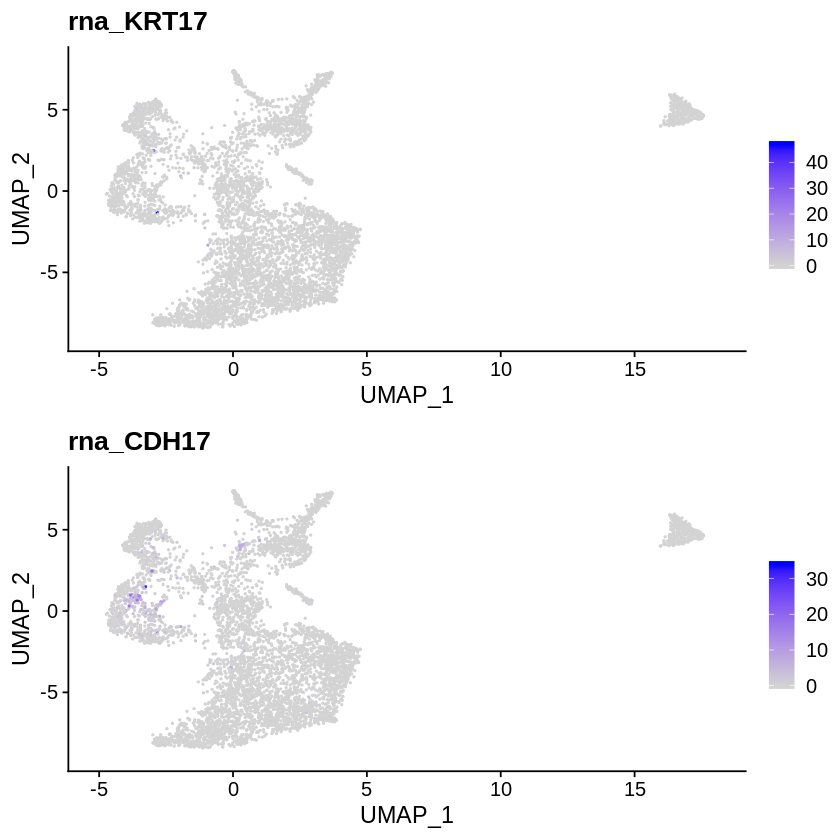

In [195]:
FeaturePlot(object =stomach_epithelial, features = c("rna_KRT17","rna_CDH17"),ncol=1)

Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'

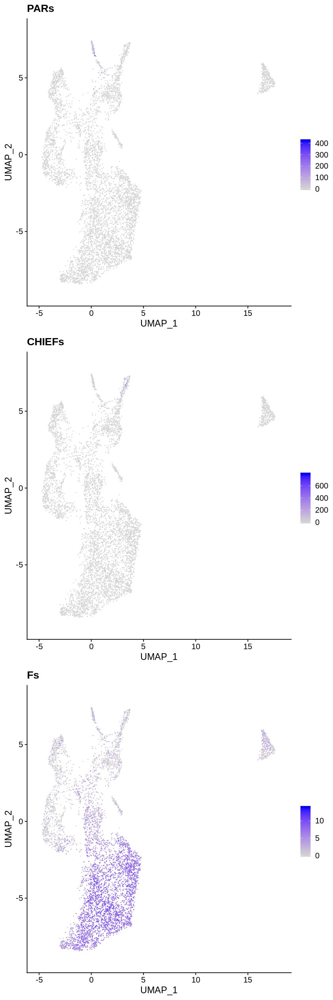

In [196]:
stomach_epithelial$CHIEFs <- AddGeneSetScore(stomach_epithelial,
                                   c("LIPF","PGC","rna_PGA3","rna_PGA4","rna_PGA5"))
stomach_epithelial$PARs <- AddGeneSetScore(stomach_epithelial,
                                   c("rna_ATP4B","rna_GIF"))
stomach_epithelial$Fs <- AddGeneSetScore(stomach_epithelial,
                                   c("GKN1", "PSCA","MUC5AC"))

options(repr.plot.width=7, repr.plot.height=21)
FeaturePlot(object = stomach_epithelial, features = c("PARs","CHIEFs","Fs"), ncol=1, pt.size = 0.1)

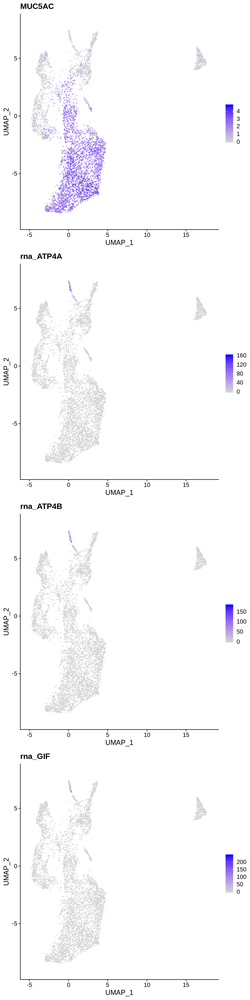

In [197]:
#epithelium
options(repr.plot.width=7, repr.plot.height=28)
FeaturePlot(object = stomach_epithelial, features = c("MUC5AC",'rna_ATP4A',"rna_ATP4B","rna_GIF"),ncol=1)

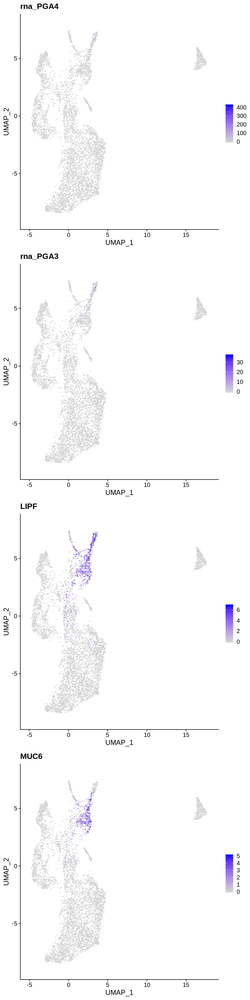

In [198]:
options(repr.plot.width=7, repr.plot.height=28)
FeaturePlot(object = stomach_epithelial, features = c('rna_PGA4', "rna_PGA3",'LIPF',"MUC6"), ncol = 1)

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: rna_TAC1, rna_NEUROG3”

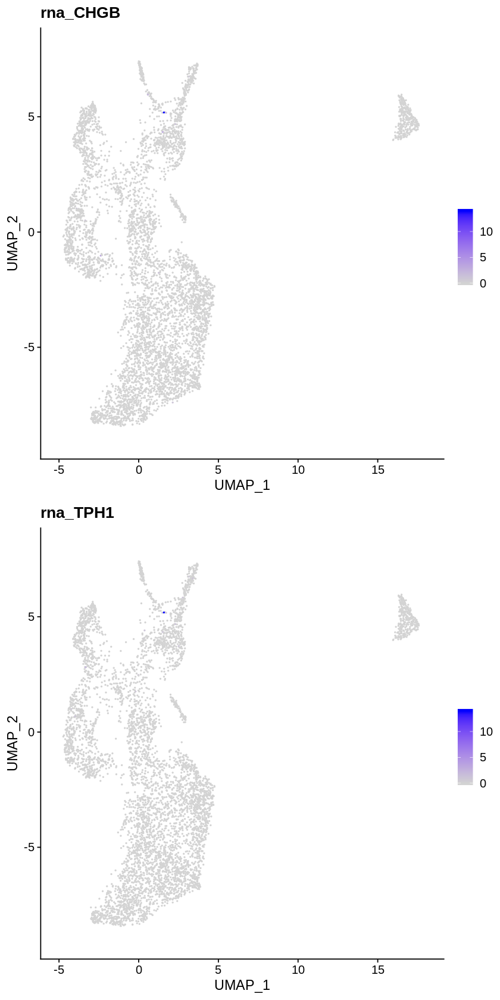

In [199]:
options(repr.plot.width=7, repr.plot.height=14)
FeaturePlot(object = stomach_epithelial, features = c('rna_CHGB','rna_TAC1','rna_TPH1','rna_NEUROG3'), ncol = 1)

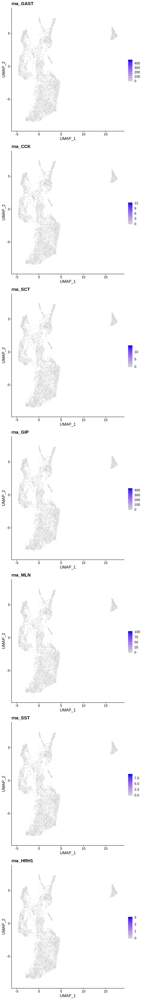

In [200]:
#endocrine
options(repr.plot.width=7, repr.plot.height=7*7)
FeaturePlot(object = stomach_epithelial, features = c("rna_GAST","rna_CCK","rna_SCT","rna_GIP","rna_MLN","rna_SST","rna_HRH1"), ncol = 1)

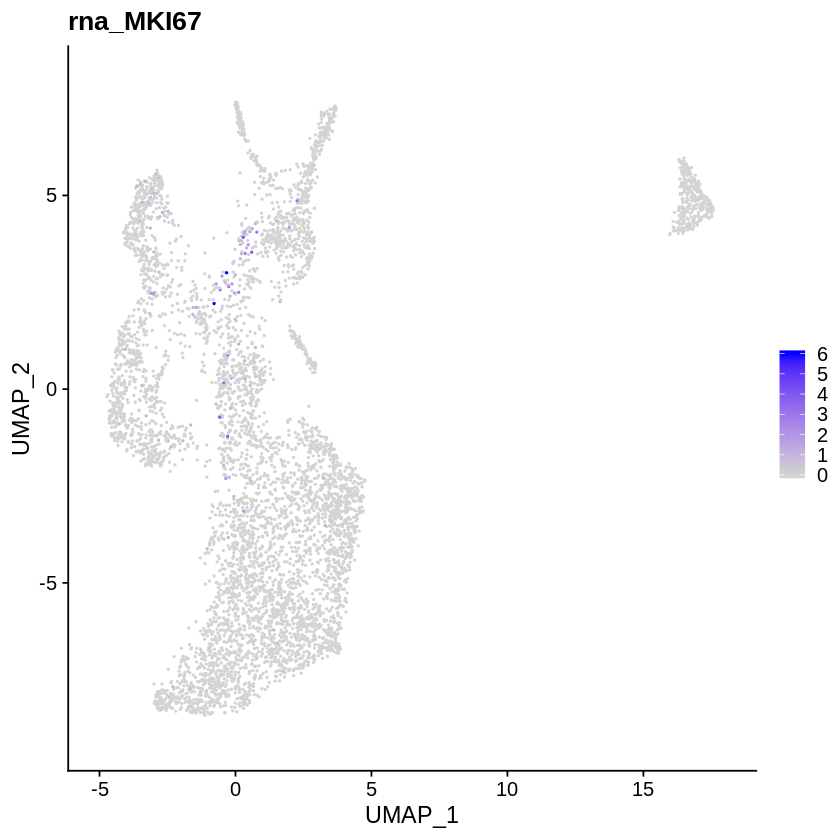

In [201]:
options(repr.plot.width=7, repr.plot.height=7)
FeaturePlot(object = stomach_epithelial, features = c("rna_MKI67"))

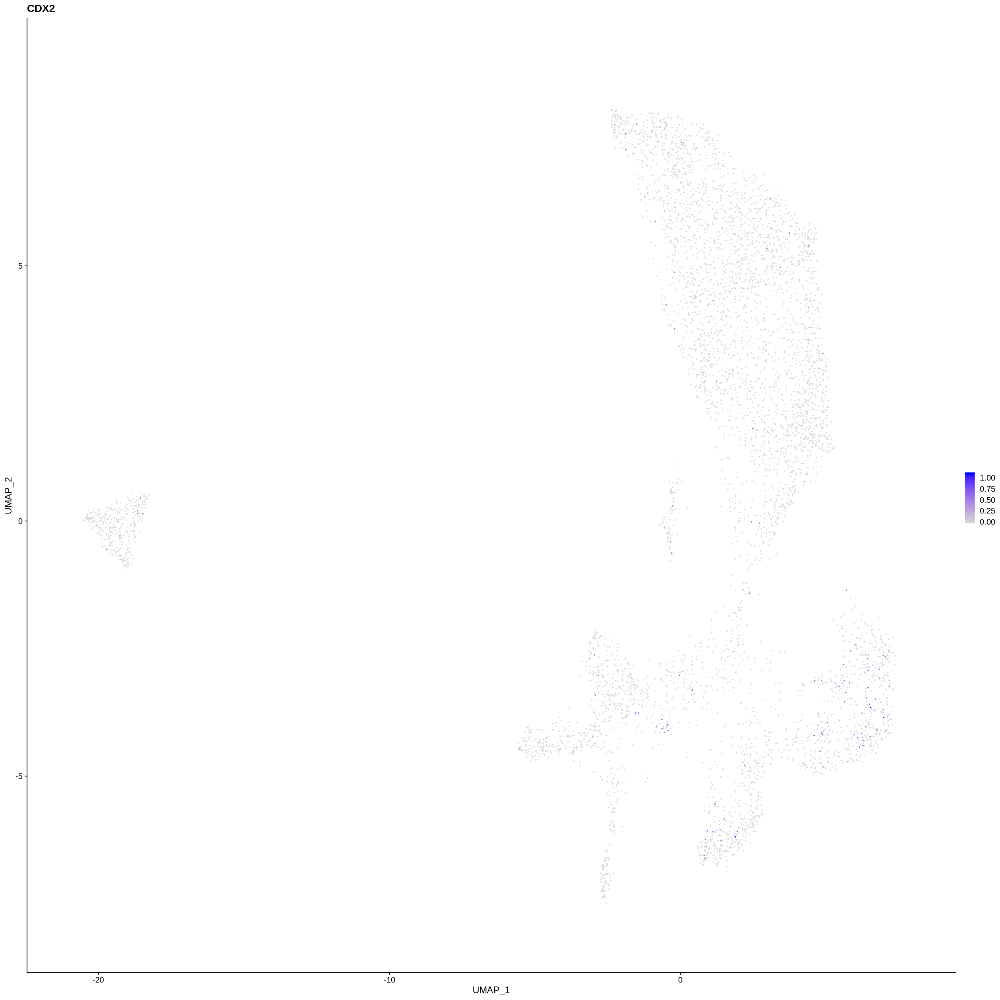

In [238]:
FeaturePlot(object = stomach_epithelial, features = c("CDX2"))

In [202]:
stomach.markers <- FindAllMarkers(object = stomach_epithelial, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster 0
Calculating cluster 1
Calculating cluster 2
Calculating cluster 3
Calculating cluster 4
Calculating cluster 5
Calculating cluster 6
Calculating cluster 7
Calculating cluster 8
Calculating cluster 9
Calculating cluster 10
Calculating cluster 11
Calculating cluster 12


In [203]:
stomach.markers %>% group_by(cluster) %>% top_n(n = 5, wt = avg_logFC) 

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
5.486359e-203,1.1468911,0.956,0.597,1.001096e-198,0,GKN1
2.775721e-180,0.8314925,0.932,0.480,5.064858e-176,0,GKN2
2.386205e-176,0.8965480,0.999,0.732,4.354109e-172,0,TFF1
1.746821e-121,0.6436442,0.914,0.563,3.187424e-117,0,TFF2
4.996184e-87,0.5530703,0.705,0.409,9.116536e-83,0,RNASE1
6.206168e-305,1.5691604,1.000,0.884,1.132439e-300,1,MALAT1
3.040329e-261,1.3419186,0.986,0.657,5.547689e-257,1,NEAT1
1.254669e-183,0.7482082,0.734,0.258,2.289395e-179,1,LIPH
5.341353e-85,0.5887551,0.702,0.388,9.746366e-81,1,ELF3


In [235]:
stomach.markers %>% group_by(cluster) %>% filter(cluster==8)

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1.021311e-170,1.1424574,0.519,0.066,1.863585e-166,8,CKB
1.035214e-127,1.1546225,0.836,0.327,1.888955e-123,8,ATP5MD
1.782778e-126,1.1655980,0.972,0.708,3.253034e-122,8,ATP5F1E
3.937921e-126,1.3174249,0.991,0.782,7.185525e-122,8,FTH1
6.444649e-126,1.2159082,0.752,0.249,1.175955e-121,8,CYCS
1.221944e-122,1.1386602,0.915,0.522,2.229681e-118,8,ATP5ME
2.279543e-119,1.1003628,0.931,0.491,4.159482e-115,8,COX7C
2.045098e-110,1.0619826,0.824,0.334,3.731690e-106,8,COX7B
8.126857e-107,1.1037022,0.770,0.302,1.482908e-102,8,UQCRB


In [205]:
stomach_epithelial <- subset(stomach_epithelial, idents=c(0,1,2,3,4,6,7,8,9,10,11,12))

In [206]:
stomach_epithelial

An object of class Seurat 
42921 features across 5294 samples within 3 assays 
Active assay: SCT (18247 features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [208]:
stomach_epithelial@active.assay <- 'integrated'

In [209]:
stomach_epithelial <- RunPCA(stomach_epithelial, verbose = TRUE)

In [210]:
stomach_epithelial <- RunUMAP(stomach_epithelial, dims = 1:30, verbose = FALSE, umap.method = 'umap-learn', metric = 'correlation')

In [211]:
stomach_epithelial <- FindNeighbors(stomach_epithelial, dims = 1:30, verbose = FALSE)
stomach_epithelial <- FindClusters(stomach_epithelial, verbose = FALSE)

In [212]:
stomach_epithelial@active.assay <- 'SCT'

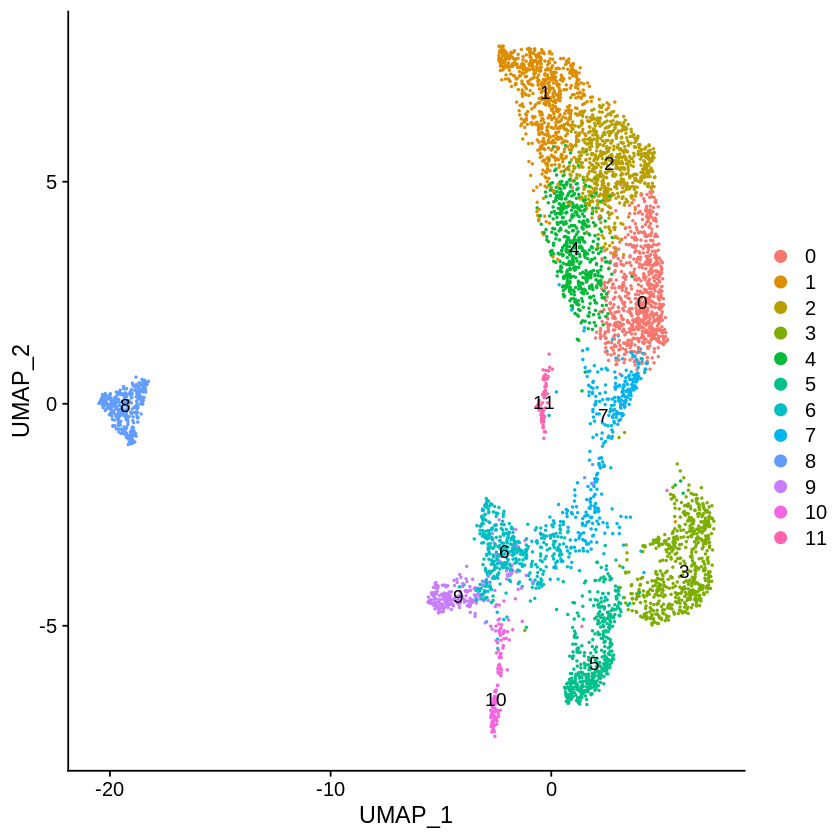

In [213]:
DimPlot(stomach_epithelial, label = TRUE)
# 0,1,2,4 foveolar
# 3 APOA1-4とか作ってるやつ
# 5 HSP出ている→損傷した腺細胞
# 6 MUC6多め→胃底腺側の腺細胞
# 7 よくわからない
# 8 これもよくわからない
# 9 chief cell
# 10 

In [214]:
stomach.markers <- FindAllMarkers(object = stomach_epithelial, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster 0
Calculating cluster 1
Calculating cluster 2
Calculating cluster 3
Calculating cluster 4
Calculating cluster 5
Calculating cluster 6
Calculating cluster 7
Calculating cluster 8
Calculating cluster 9
Calculating cluster 10
Calculating cluster 11


In [215]:
stomach.markers %>% group_by(cluster) %>% top_n(n = 5, wt = avg_logFC) 

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
7.470519e-151,0.9572275,0.960,0.606,1.363146e-146,0,GKN1
9.436369e-140,0.7049030,0.939,0.490,1.721854e-135,0,GKN2
3.847529e-123,0.6697871,0.999,0.720,7.020587e-119,0,TFF1
4.779954e-85,0.4940597,0.911,0.557,8.721982e-81,0,TFF2
5.904029e-48,0.4923590,0.979,0.861,1.077308e-43,0,IGKC
5.148861e-297,1.5766931,1.000,0.880,9.395126e-293,1,MALAT1
1.959867e-255,1.3471762,0.986,0.653,3.576169e-251,1,NEAT1
1.523117e-182,0.7568613,0.738,0.253,2.779231e-178,1,LIPH
6.602472e-106,0.5376855,0.541,0.191,1.204753e-101,1,CAPN8


In [228]:
stomach_epithelial

An object of class Seurat 
42921 features across 5294 samples within 3 assays 
Active assay: SCT (18247 features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

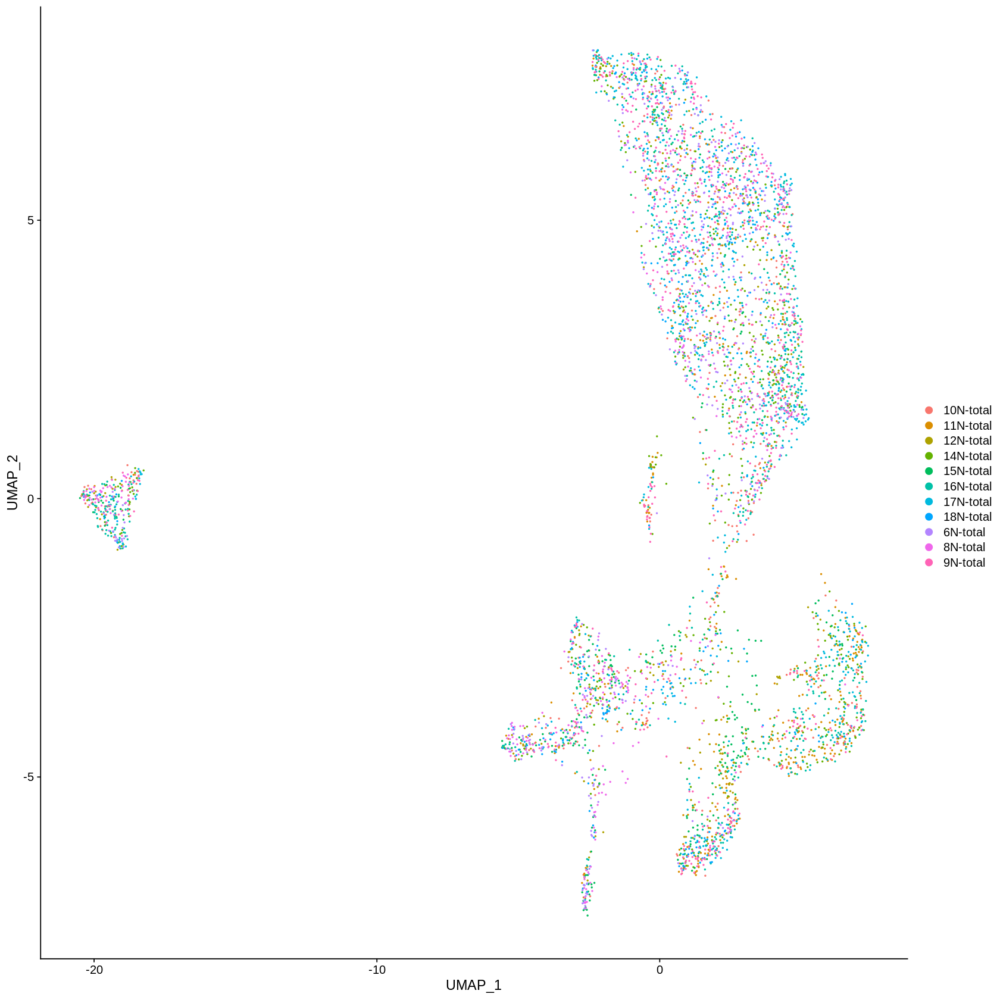

In [250]:
options(repr.plot.width=14, repr.plot.height=14)
DimPlot(stomach_epithelial)

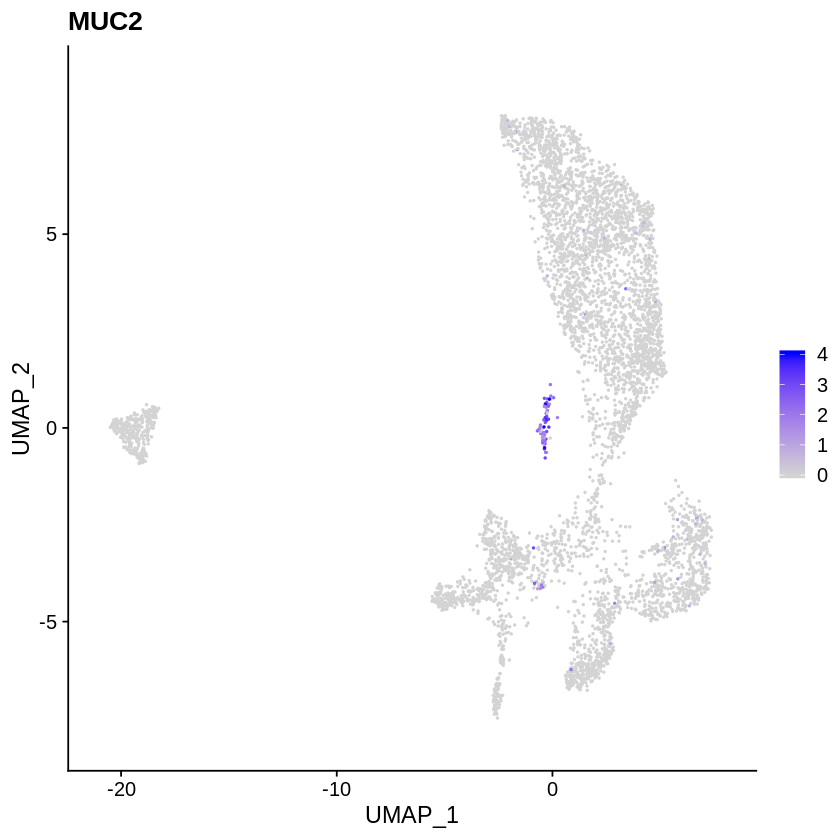

In [247]:
options(repr.plot.width=7, repr.plot.height=7)
FeaturePlot(stomach_epithelial, features=c('MUC2'),ncol=1)

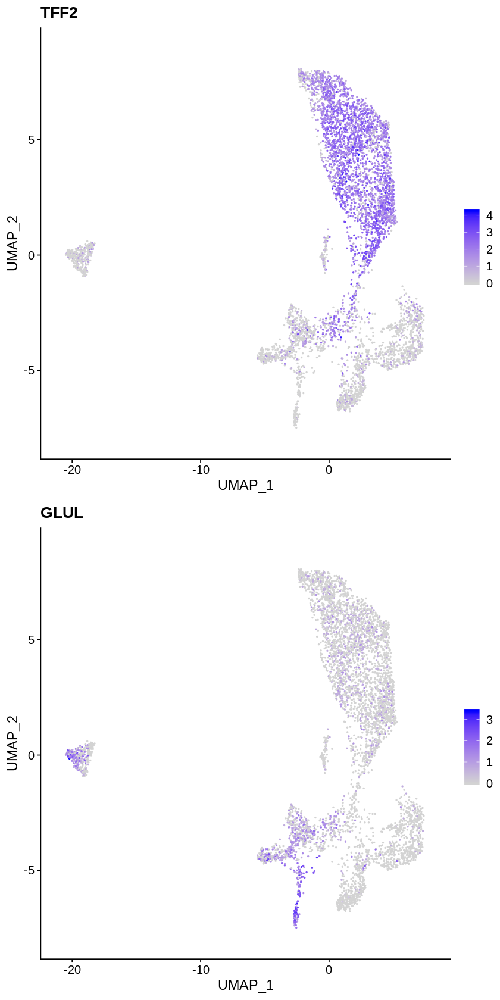

In [227]:
options(repr.plot.width=7, repr.plot.height=14)
FeaturePlot(stomach_epithelial, features=c('TFF2','GLUL'),ncol=1)

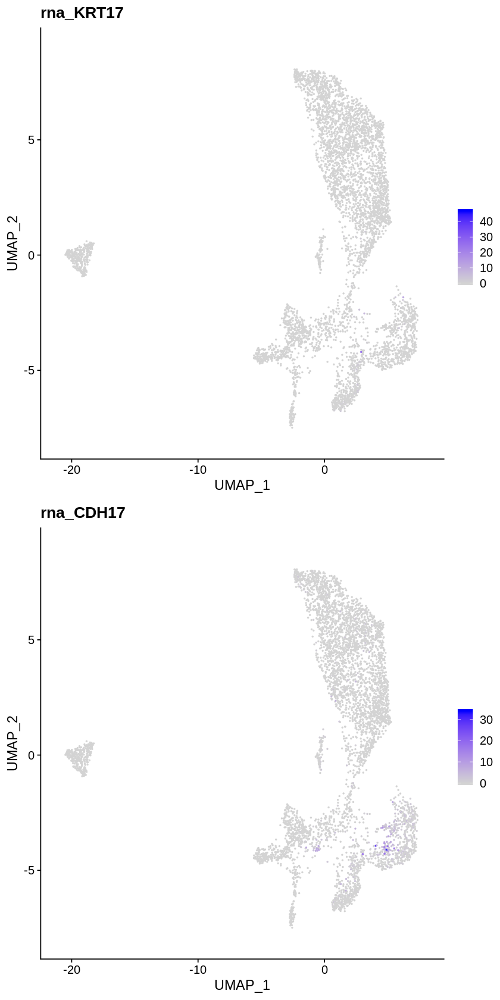

In [226]:
options(repr.plot.width=7, repr.plot.height=14)
FeaturePlot(object =stomach_epithelial, features = c("rna_KRT17","rna_CDH17"),ncol=1)

Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'

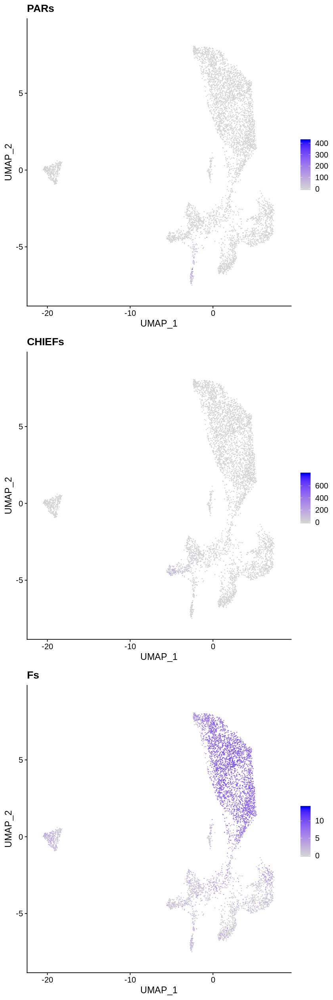

In [218]:
stomach_epithelial$CHIEFs <- AddGeneSetScore(stomach_epithelial,
                                   c("LIPF","PGC","rna_PGA3","rna_PGA4","rna_PGA5"))
stomach_epithelial$PARs <- AddGeneSetScore(stomach_epithelial,
                                   c("rna_ATP4B","rna_GIF"))
stomach_epithelial$Fs <- AddGeneSetScore(stomach_epithelial,
                                   c("GKN1", "PSCA","MUC5AC"))

options(repr.plot.width=7, repr.plot.height=21)
FeaturePlot(object = stomach_epithelial, features = c("PARs","CHIEFs","Fs"), ncol=1, pt.size = 0.1)

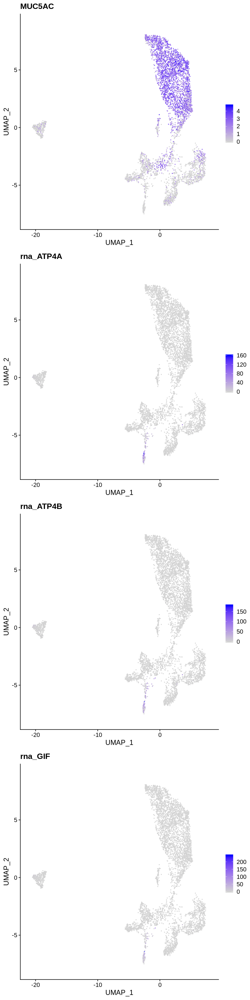

In [240]:
#epithelium
options(repr.plot.width=7, repr.plot.height=28)
FeaturePlot(object = stomach_epithelial, features = c("MUC5AC",'rna_ATP4A',"rna_ATP4B","rna_GIF"),ncol=1)

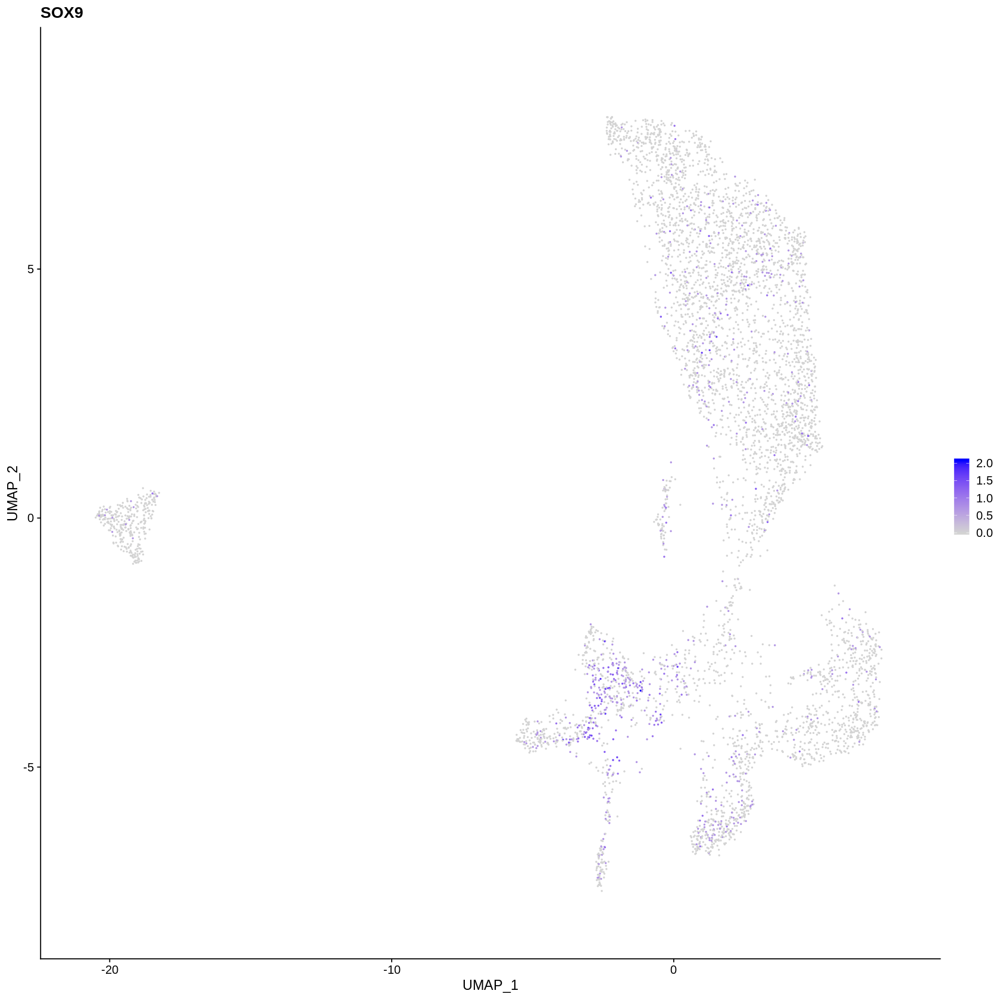

In [246]:
options(repr.plot.width=14, repr.plot.height=14)
FeaturePlot(object = stomach_epithelial, features = c('SOX9'), ncol = 1)

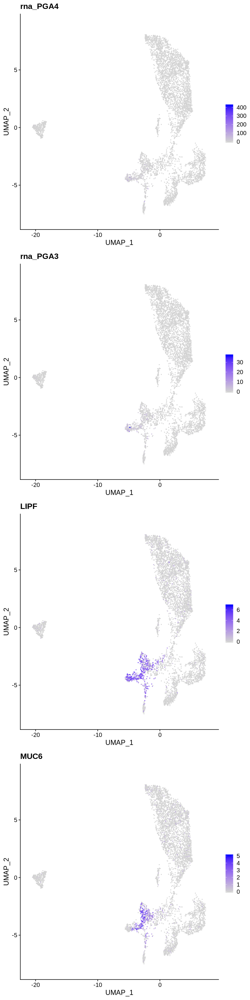

In [220]:
options(repr.plot.width=7, repr.plot.height=28)
FeaturePlot(object = stomach_epithelial, features = c('rna_PGA4', "rna_PGA3",'LIPF',"MUC6"), ncol = 1)

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: rna_TAC1, rna_NEUROG3”

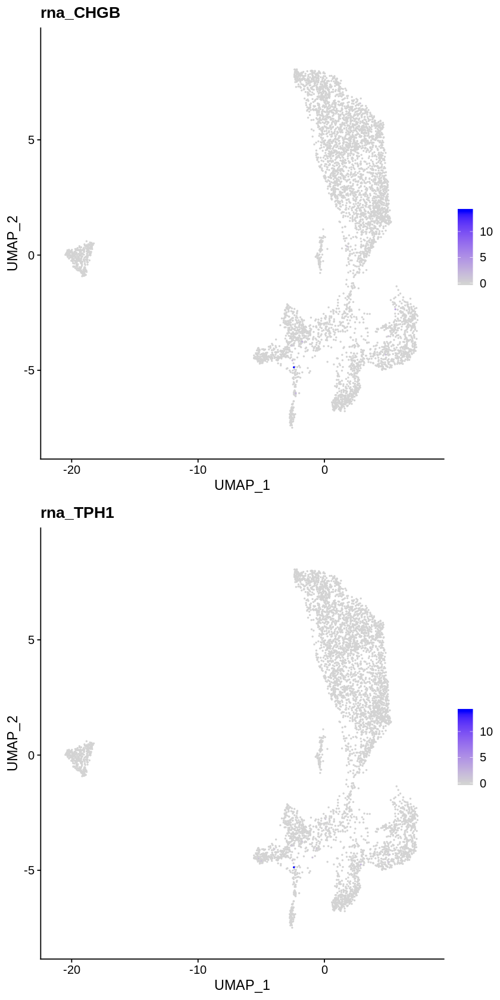

In [221]:
options(repr.plot.width=7, repr.plot.height=14)
FeaturePlot(object = stomach_epithelial, features = c('rna_CHGB','rna_TAC1','rna_TPH1','rna_NEUROG3'), ncol = 1)

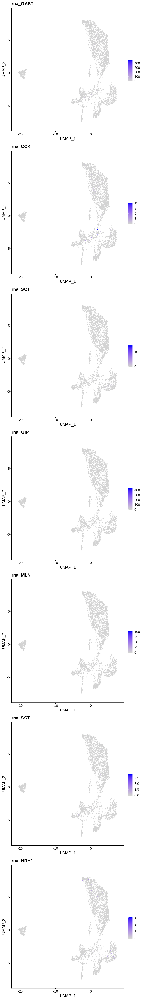

In [222]:
#endocrine
options(repr.plot.width=7, repr.plot.height=7*7)
FeaturePlot(object = stomach_epithelial, features = c("rna_GAST","rna_CCK","rna_SCT","rna_GIP","rna_MLN","rna_SST","rna_HRH1"), ncol = 1)

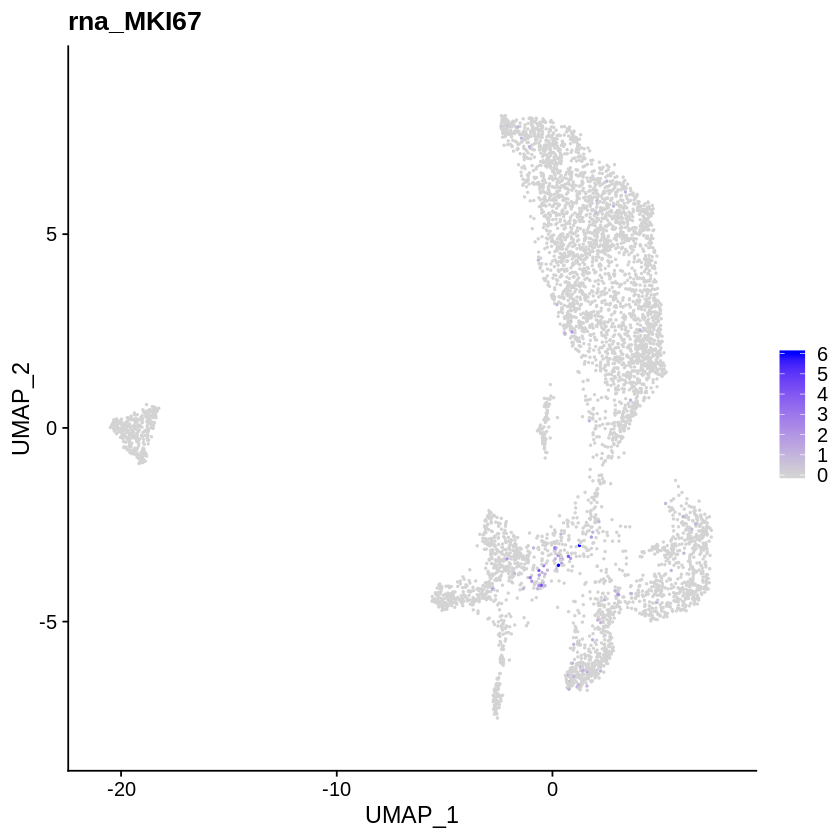

In [224]:
options(repr.plot.width=7, repr.plot.height=7)
FeaturePlot(object = stomach_epithelial, features = c("rna_MKI67"))

In [254]:
save(stomach_epithelial,file='Normal_epi_Seurat_20190905.RData')
save(stomach.markers,file='Normal_epi_markers_20190905.RData')

# ↓SingleR使ってみた

In [255]:
counts.table <- GetAssayData(stomach_epithelial@assays$RNA)

In [256]:
annot.table <- stomach_epithelial@meta.data$seurat_clusters

In [ ]:
singler = CreateSinglerObject(counts.table, annot.table, stomach_epithelial, min.genes = 0,
  technology = "10X", species = "Human", citation = "",
  ref.list = list(), normalize.gene.length = F, variable.genes = "de",
  fine.tune = T, do.signatures = T, clusters = NULL, do.main.types = T, 
  reduce.file.size = T, numCores = SingleR.numCores)

In [ ]:
## if using Seurat v3.0 and over use:
singler$meta.data$xy = stomach_epithelial@reductions$umap@cell.embeddings # the tSNE coordinates
singler$meta.data$clusters = stomach_epithelial@active.ident # the Seurat clusters (if 'clusters' not provided)

In [ ]:
save(singler,file='stomach_epithelial_singler.RData')

In [ ]:
SingleR.Plot

In [ ]:
out = SingleR.PlotTsne(singler$singler[[1]]$SingleR.single,
      singler$meta.data$xy, do.label = FALSE, do.letters = F,
      labels=singler$meta.data$orig.ident,label.size = 6, 
      dot.size = 3)
out$p

In [ ]:
options(repr.plot.width=7, repr.plot.height=7)
SingleR.DrawHeatmap(SingleR = singler$singler[[1]]$SingleR.single.main, top.n = Inf, clusters = singler$meta.data$clusters)

In [ ]:
out = SingleR.PlotTsne(singler$singler[[1]]$SingleR.single,
        singler$meta.data$xy,do.label=FALSE,
        do.letters = T,labels = singler$singler[[1]]$SingleR.single$labels,
        label.size = 4, dot.size = 3)
out$p